# SVM и его ядра

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [1]:
import random
from typing import Callable

import matplotlib.pyplot as plt
from scipy.spatial import distance
import numpy as np
from cvxopt import matrix, spmatrix, solvers, sparse
from cvxopt.solvers import qp
from sklearn.datasets import make_blobs, make_moons

solvers.options["show_progress"] = False
import warnings
warnings.simplefilter(action='ignore')

In [2]:
SEED = 7
np.random.seed(SEED)
random.seed(SEED)

In [3]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200

    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(
        np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h)
    )
    mesh = np.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading="gouraud")

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors="black")
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors="black", linestyles="dashed")

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(
        X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1.0, edgecolor="black", linewidth=0.8
    )
    plt.scatter(
        X[ind_incorrect, 0],
        X[ind_incorrect, 1],
        c=y[ind_incorrect],
        cmap=cm,
        alpha=1.0,
        marker="*",
        s=50,
        edgecolor="black",
        linewidth=0.8,
    )
    plt.scatter(
        X[ind_support, 0],
        X[ind_support, 1],
        c=y[ind_support],
        cmap=cm,
        alpha=1.0,
        edgecolor="yellow",
        linewidths=1.0,
        s=40,
    )

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [4]:
def generate_moons_dataset(n_points=1000, noise=0.075):
    X, y = make_moons(n_points, noise=noise, random_state=SEED)
    return X, 2 * y - 1

def generate_blobs_dataset(n_points=1000, n_features=2):
    X, y = make_blobs(n_points, n_features, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=SEED)
    y = 2 * (y % 2) - 1
    return X, y

X_moons, y_moons = generate_moons_dataset()
X_blobs, y_blobs = generate_blobs_dataset()

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM.

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

А наша задача формулируется так:

$\begin{cases}0.5 \cdot w^\text{T}w + C \cdot \sum \xi_i \rightarrow \min_{w, \xi} \\ \xi \geq 0 \\ y_i (w^\text{T}x_i + w_0) \geq 1 - \xi_i \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = (w, w_0, \xi) \\ P =
\left[
    \begin{array}{c|c}
      I & 0\\
      \hline
      0 & 0
    \end{array}
\right] \\
q = \left[
    \begin{array}{c}
      0 \\
      \hline
      C
    \end{array}
\right] \\
 G =
\left[
    \begin{array}{c|c|c}
      0 & 0 & -I\\
      \hline
      -yX & -y & -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      0 \\
      \hline
      -1
    \end{array}
\right] $

In [5]:
class LinearSVM:
    def __init__(self, C: float):
        """SVM with linear kernel

        Args:
            C: Soft margin coefficient.
        """
        self.C = C
        self.support = None
        self._weights = None
        self._bias = None

    def fit(self, X: np.ndarray, y: np.ndarray):
        """Fit SVM using cvxopt.solvers.qp

        Args:
            X: Train data, [n_samlpes, n_features]
            y: Binary labels (-1 or +1), [n_samples,]
        """
        n_samples, n_features = X.shape
        y = y.reshape(-1, 1)

        ones = np.ones((n_samples, 1))

        n = n_features + 1 + n_samples

        QP_P = spmatrix(1, range(n_features), range(n_features), (n, n))

        q1 = matrix(0.0, (n_features + 1, 1))
        q2 = matrix(self.C, (n_samples, 1))
        QP_q = matrix([q1, q2])

        G_u_vals = [-1.0] * n_samples
        G_u_rows = list(range(n_samples))
        G_u_cols = list(range(n_features + 1, n))
        G_u = spmatrix(G_u_vals, G_u_rows, G_u_cols, (n_samples, n))

        Y_diag = np.diag(y.flatten())
        minus_YX = -Y_diag @ X
        rows_YX, cols_YX = minus_YX.nonzero()
        vals_YX = minus_YX[rows_YX, cols_YX]
    
        minus_y = -y
        rows_y = np.arange(n_samples)
        cols_y = np.full(n_samples, n_features)
        vals_y = minus_y.flatten()
    
        rows_I = np.arange(n_samples)
        cols_I = np.arange(n_features + 1, n)
        vals_I = np.full(n_samples, -1.0)
    
        G_d_rows = np.concatenate((rows_YX, rows_y, rows_I))
        G_d_cols = np.concatenate((cols_YX, cols_y, cols_I))
        G_d_vals = np.concatenate((vals_YX, vals_y, vals_I))
        G_d = spmatrix(G_d_vals.tolist(), G_d_rows.tolist(), G_d_cols.tolist(), (n_samples, n))
        QP_G = sparse([G_u, G_d])

        h1 = matrix(0.0, (n_samples, 1))
        h2 = matrix(-1.0, (n_samples, 1))
        QP_h = matrix([h1, h2])

        opt = qp(QP_P, QP_q, QP_G, QP_h)
        x_opt = np.array(opt["x"]).flatten()
        self._weights = x_opt[:n_features]
        self._bias = x_opt[n_features]
        self.support = x_opt[n_features + 1:]

    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """Calculate decision for the points, i.e. prediction without sign

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Decision for each input point, [n_samples, ]
        """

        return np.array([np.dot(self._weights, x) + self._bias for x in X])


    def predict(self, X: np.ndarray) -> np.ndarray:
        """Classify input points

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Predicited class for each point (-1 or +1), [n_samples, ]
        """

        decision_res = self.decision_function(X)
        return np.array([np.sign(res) for res in decision_res])
        


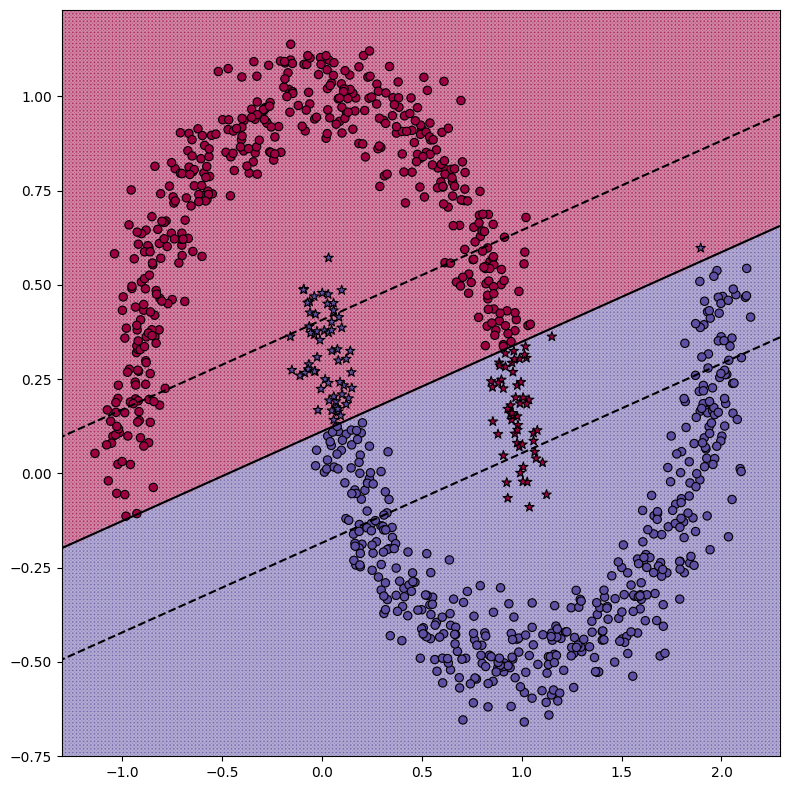

In [6]:
svm = LinearSVM(1)
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

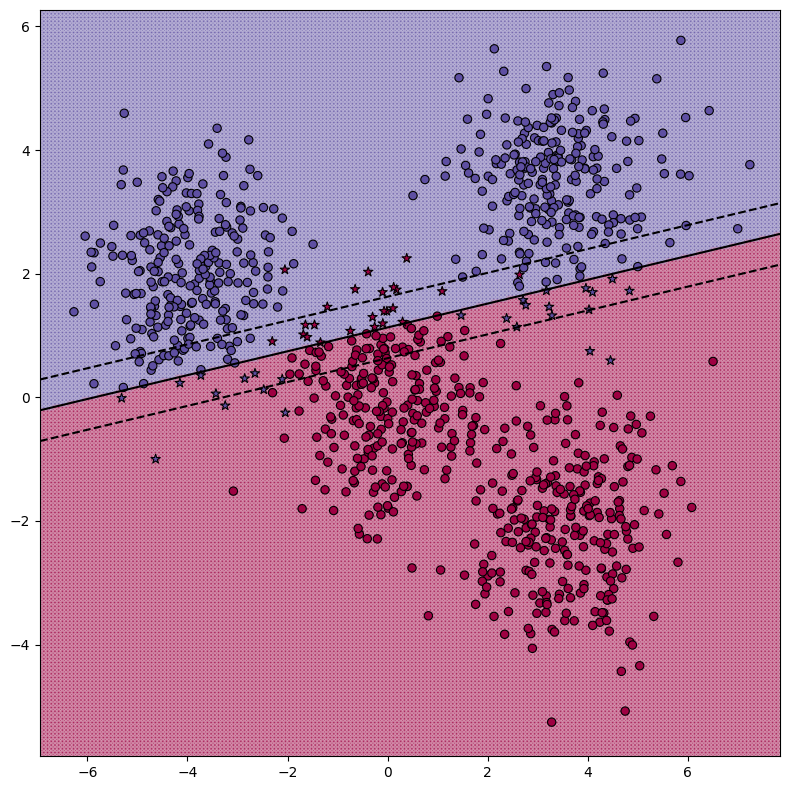

In [7]:
svm = LinearSVM(1)
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

### Задание 2 (1 балл)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [8]:
def linear_kernel(x1: np.ndarray, x2: np.ndarray) -> np.ndarray:
    return x1.dot(x2.T)


def get_polynomial_kernel(c=1, power=2):
    def polynomial_kernel(x1: np.ndarray, x2: np.ndarray) -> np.ndarray:
        return (np.dot(x1, x2.T) + c) ** power

    return polynomial_kernel


def get_gaussian_kernel(sigma=1.0):

    def gaussian_kernel(x1: np.ndarray, x2: np.ndarray) -> np.ndarray:
        sq_norm = np.sqrt(np.sum((x1 - x2)**2 for x1, x2 in zip(x1, x2)))
        coef = 1 / (2 * sigma**2)
        return np.exp(-coef * sq_norm)

    return gaussian_kernel

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

### Решение с помощью QP Solver

QP-solver решает такую задачу:

$\begin{cases}0.5 \cdot x^\text{T}Px + q^\text{T}x\rightarrow \min_x\\Gx \leq h\\Ax=b\end{cases}$

Будем решать двойственную задачу. Формулируется она так:

$\begin{cases}\sum \alpha_i - 0.5 \sum \alpha_i \alpha_j y_i y_j K(x_i, x_j) \rightarrow \max_{\alpha}\\ C \geq \alpha \geq 0 \\ y_i \alpha = 0 \end{cases}$

Сведем ее к задаче QP-solver'а:

$ x = \alpha \\ P =
\left[ y_i y_j K(y_i, y_j) \right] \\
q = \left[ -1
\right] \\
 G =
\left[
    \begin{array}{c}
      I\\
      \hline
      -I
    \end{array}
\right] \\ h = \left[
    \begin{array}{c}
      C \\
      \hline
      0
    \end{array}
\right] \\
b = 0\\
A = y^\text{T}$

В таком случае решающей функцией будет:

$a(x) = \text{sign} (\sum \alpha_i y_i K(x, x_i) + w_0)$, где $w_0 = \frac{1}{n}\sum\limits_{i=1}^{n}[y_i - \sum \alpha_j y_j K(x_i, x_j)]$

In [9]:
class KernelSVM:

    def __init__(self, C: float, kernel: Callable = linear_kernel):
        """SVM with specified kernel

        Args:
            C: Soft margin coefficient
            kernel: Callable kernel for kernel trick
        """
        self.C = C
        self.kernel = kernel
        self.alphas = None
        self._X = None
        self._y = None
        self._bias = None

    def fit(self, X: np.ndarray, y: np.ndarray):
        """Fit SVM using cvxopt.solvers.qp

        Args:
            X: Train data, [n_samles, n_features]
            y: Binary labels (-1 or +1), [n_samples,]
        """
        self._X = X
        self._y = y.reshape(-1, 1)
        n_samples, n_features = X.shape

        K_mat = np.array([[self.kernel(X[i], X[j]) for j in range(n_samples)] for i in range(n_samples)])
        P = np.outer(y.flatten(), y.flatten()) * K_mat
        QP_P = matrix(P)
        
        QP_q = matrix(-1.0, (n_samples, 1))

        I = spmatrix(1.0, range(n_samples), range(n_samples))
        QP_G = matrix([I, -I])

        h1 = matrix(self.C, (n_samples, 1))
        h2 = matrix(0.0, (n_samples, 1))
        QP_h = matrix([h1, h2])
        
        QP_b = matrix(0.0)
        QP_A = matrix(self._y.T.astype(float))

        opt = qp(QP_P, QP_q, QP_G, QP_h, QP_A, QP_b)
        self.alphas = np.array(opt["x"]).flatten()
        self.support = self.alphas
        
        ay = self.alphas * y.flatten()
        predictions = K_mat @ ay
        diffs = y.flatten() - predictions
        self._bias = np.mean(diffs)

    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """Calculate decision for the points, i.e. prediction without sign

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Decision for each input point, [n_samples, ]
        """
        n, _ = self._X.shape
        kernel = self.kernel
        alphas = self.alphas
        bias = self._bias

        ay = alphas * self._y.flatten()
        K_mat = np.array([[self.kernel(x, x_i) for x_i in self._X] for x in X])
        
        return K_mat @ ay + bias

    def predict(self, X: np.ndarray) -> np.ndarray:
        """Classify input points

        Args:
            X: Input data, [n_samples, n_features]

        Return:
            Predicited class for each point (-1 or +1), [n_samples, ]
        """
        decisions = self.decision_function(X)
        return np.sign(decisions)


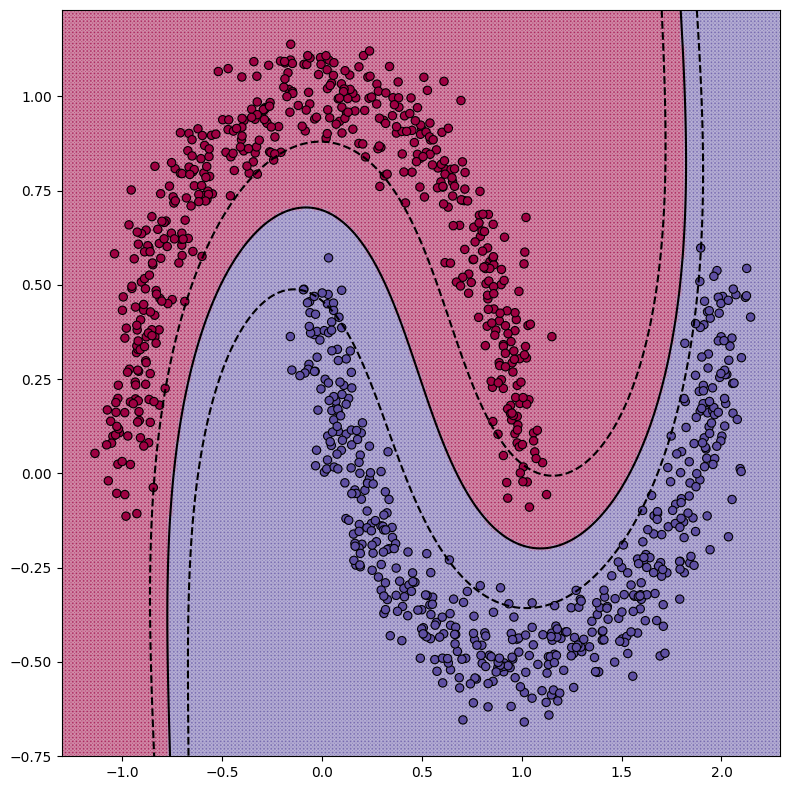

In [10]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

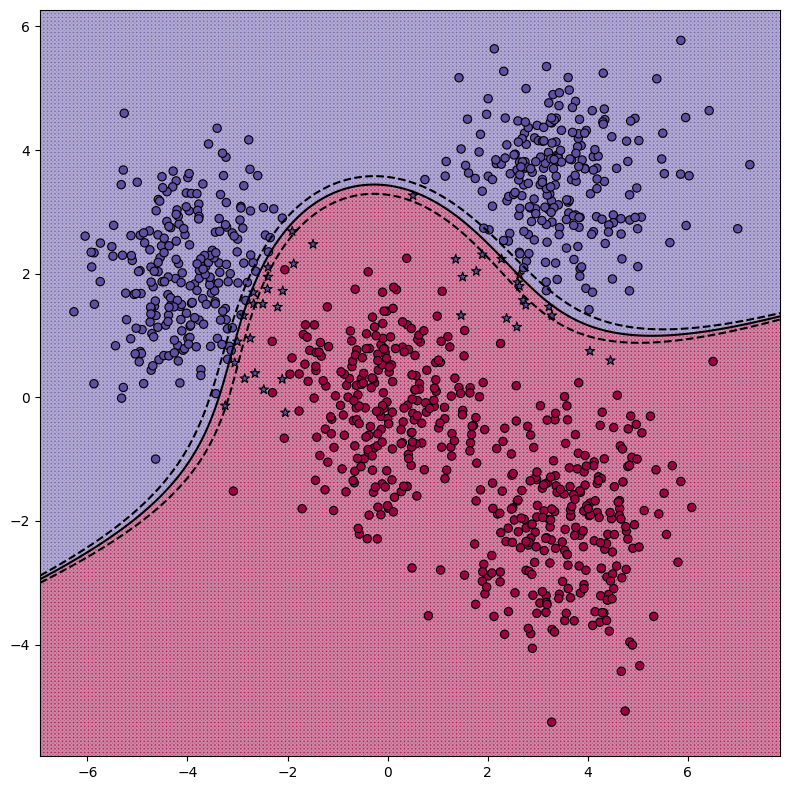

In [11]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

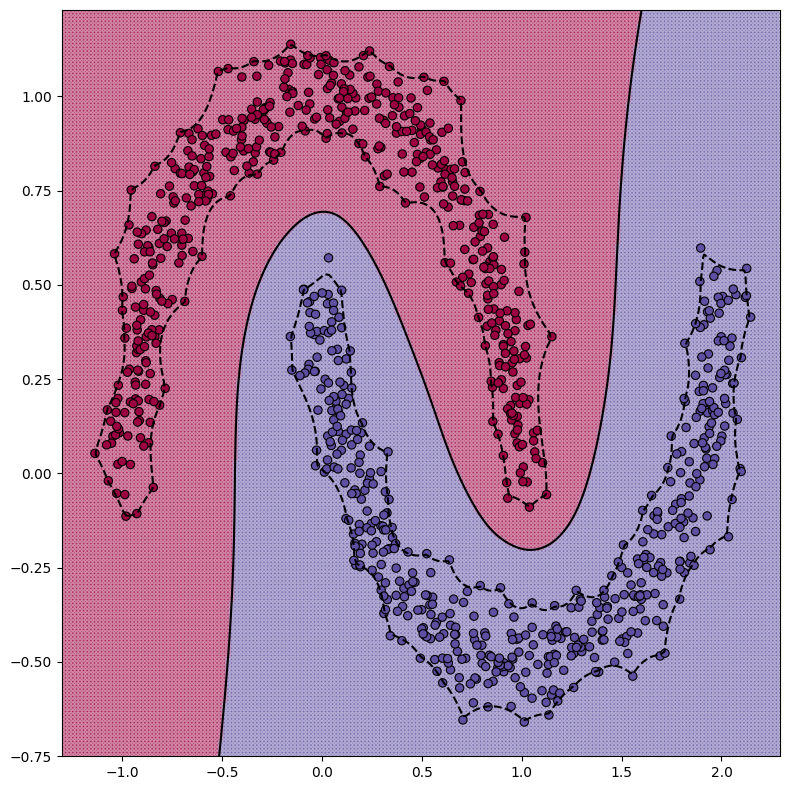

In [12]:
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X_moons, y_moons)
visualize(svm, X_moons, y_moons)
plt.show()

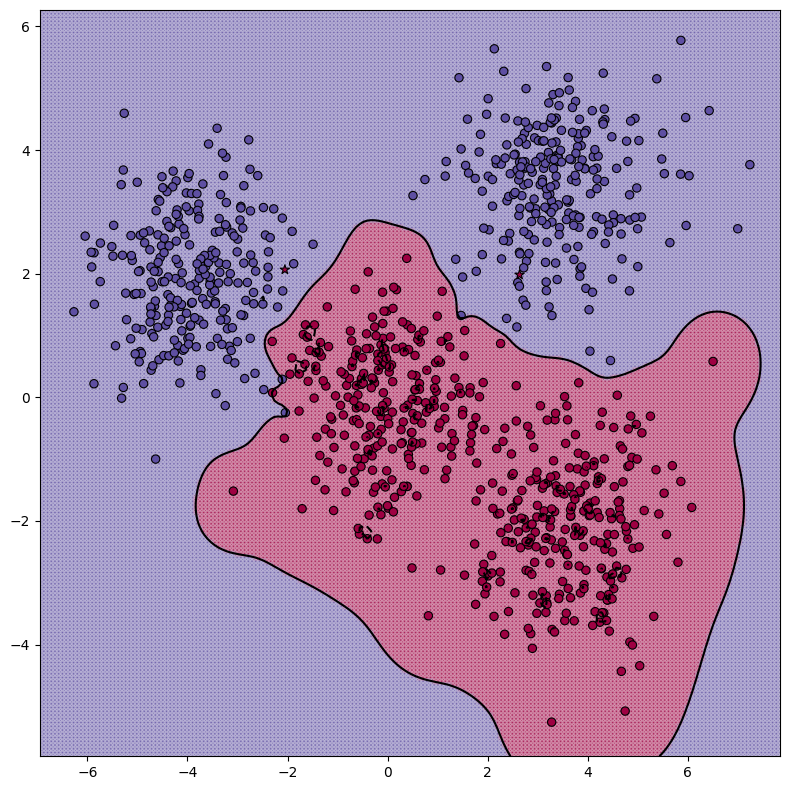

In [13]:
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X_blobs, y_blobs)
visualize(svm, X_blobs, y_blobs)
plt.show()

### Задание 4 (2 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

### Polynomial kernel

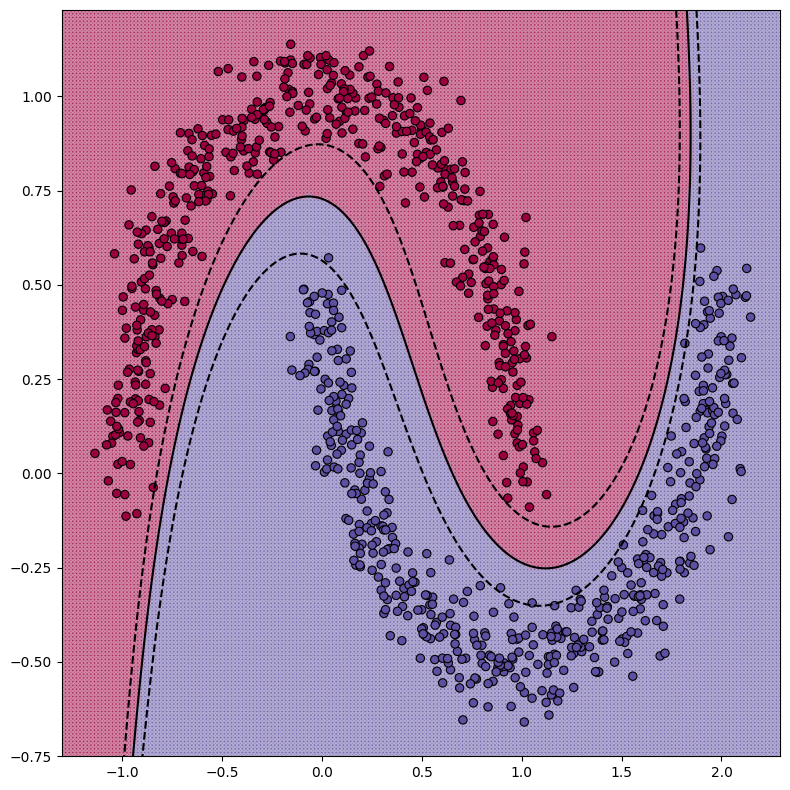

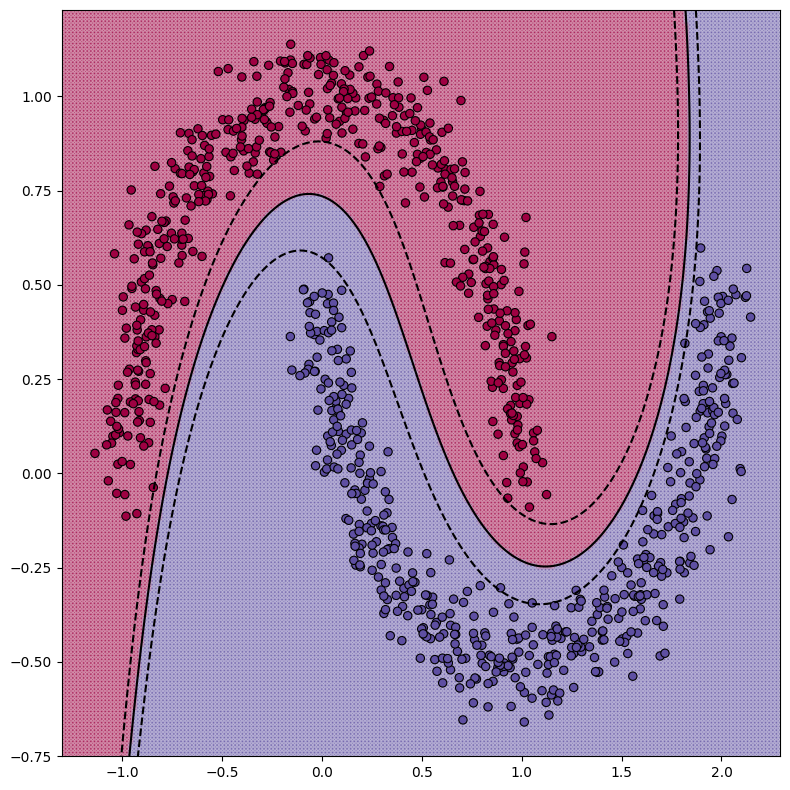

In [14]:
svm_c_25 = KernelSVM(1, kernel=get_polynomial_kernel(25, 5))
svm_c_50 = KernelSVM(1, kernel=get_polynomial_kernel(500, 5))
svm_c_25.fit(X_moons, y_moons)
svm_c_50.fit(X_moons, y_moons)
visualize(svm_c_25, X_moons, y_moons)
plt.show()
plt.close()
visualize(svm_c_50, X_moons, y_moons)
plt.show()
plt.close()

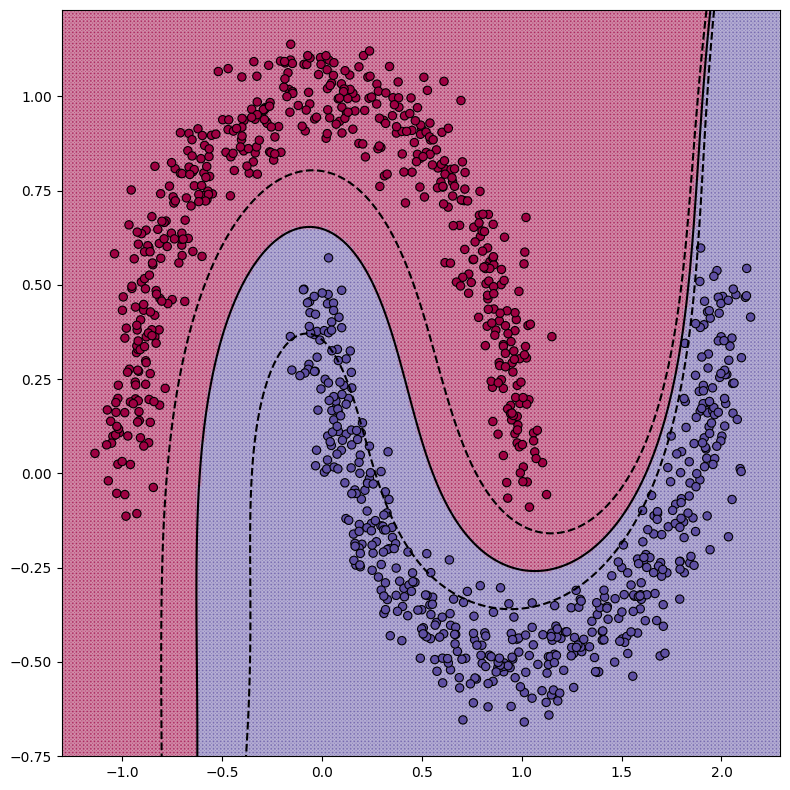

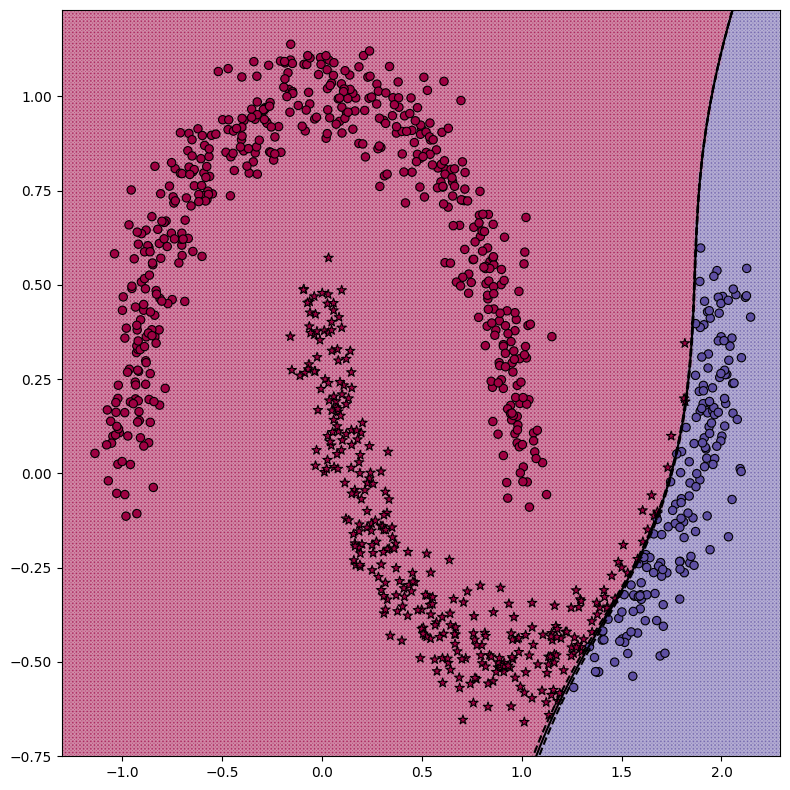

In [15]:
svm_power_5 = KernelSVM(1, kernel=get_polynomial_kernel(1, 5))
svm_power_12 = KernelSVM(1, kernel=get_polynomial_kernel(1, 12))
svm_power_5.fit(X_moons, y_moons)
svm_power_12.fit(X_moons, y_moons)
visualize(svm_power_5, X_moons, y_moons)
plt.show()
plt.close()
visualize(svm_power_12, X_moons, y_moons)
plt.show()
plt.close()

**Вывод**: Константа c внутри ядра сильнее влияет на вклад меньших степеней внутри decision function, однако на синтетических данных сильного отличия не видно. С увеличение степени внутри ядра, мы увеличиваем значимость близких друг к другу обьектов. Поэтому алгоритм будет стараться отделить только наиболее близкие друг к другу элементы положительного класса, что плохо скажется на качестве модели. Так же, увеличение степени увеличивает гибкость модели, что приводит к переобучению. На примере со степенью 12 видно, что модель сильно переобучилась.

### RBF kernel


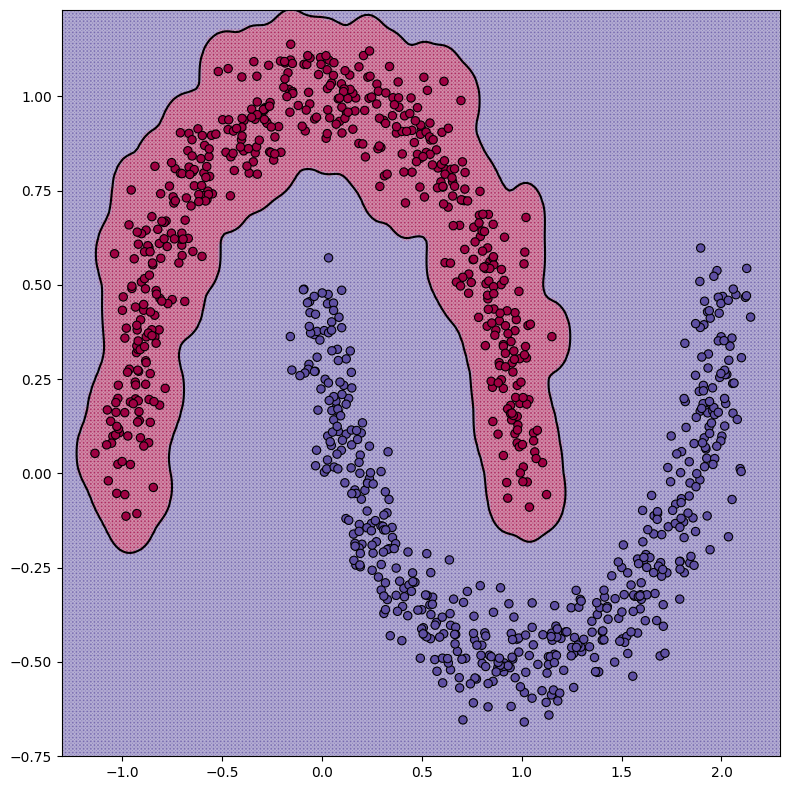

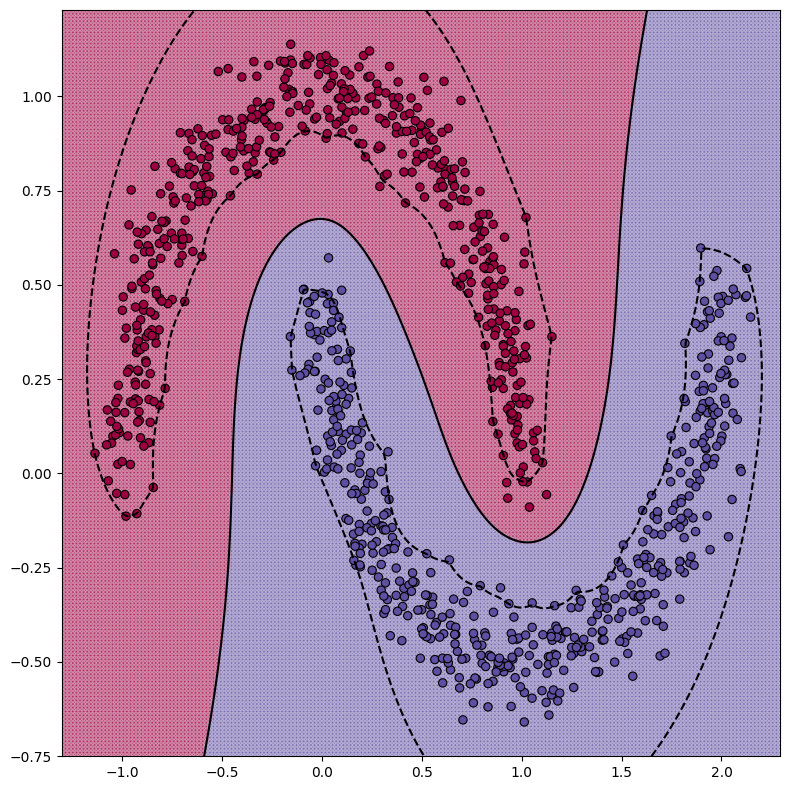

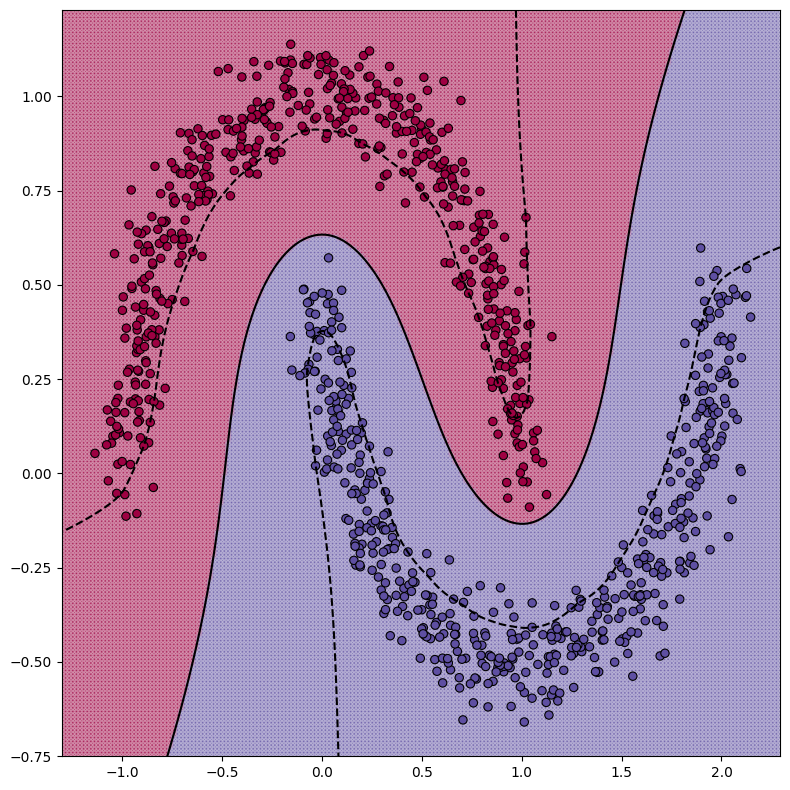

In [16]:
svm_sigma_1 = KernelSVM(1, kernel=get_gaussian_kernel(0.1))
svm_sigma_7 = KernelSVM(1, kernel=get_gaussian_kernel(0.7))
svm_sigma_20 = KernelSVM(1, kernel=get_gaussian_kernel(2.0))
svm_sigma_1.fit(X_moons, y_moons)
svm_sigma_7.fit(X_moons, y_moons)
svm_sigma_20.fit(X_moons, y_moons)
visualize(svm_sigma_1, X_moons, y_moons)
plt.show()
plt.close()
visualize(svm_sigma_7, X_moons, y_moons)
plt.show()
plt.close()
visualize(svm_sigma_20, X_moons, y_moons)
plt.show()
plt.close()

**Вывод**: Параметр сигма определяет радиус влияния каждого объекта. Если сигма маленькое, то наш алгоритм переобучается (что видно на первом графике).

# Задание 5 (3 балла)

Поставьте эксперимент и сравните SVM с логистической регрессией на синтетических данных. Для этого для каждого датасета:

1. Воспользуйтесь реализацией логистической регрессии из `sklearn`
2. Подготовьте данные, преобразуйте их для лучшей разделимости, например, добавьте polynomial features
3. Зафиксируйте метрику
4. Подберите гиперпараметры обоих моделей
5. Напишите вывод, какая из моделей обучилась лучше и почему так вышло

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

X_moons, y_moons = generate_moons_dataset()
X_blobs, y_blobs = generate_blobs_dataset()

X_train_moons, X_val_moons, y_train_moons, y_val_moons = train_test_split(X_moons, y_moons, random_state=SEED)
X_val_moons, X_test_moons, y_val_moons, y_test_moons = train_test_split(X_val_moons, y_val_moons, random_state=SEED)

X_train_blobs, X_val_blobs, y_train_blobs, y_val_blobs = train_test_split(X_blobs, y_blobs, random_state=SEED)
X_val_blobs, X_test_blobs, y_val_blobs, y_test_blobs = train_test_split(X_val_blobs, y_val_blobs, random_state=SEED)


In [18]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

In [19]:
def compare_models(metric, svm1, svm2, log_reg, X_train, y_train, X_test, y_test):
    svm1.fit(X_train, y_train)
    svm2.fit(X_train, y_train)
    log_reg.fit(X_train, y_train)
    
    svm1_pred = svm1.predict(X_test)
    svm2_pred = svm2.predict(X_test)
    log_reg_pred = log_reg.predict(X_test)
    
    svm1_acc = metric(y_test, svm1_pred)
    svm2_acc = metric(y_test, svm2_pred)
    log_reg_acc = metric(y_test, log_reg_pred)
    
    print(f"SVM with polynomial kernel score: {svm1_acc}")
    print(f"SVM with gaussian kernel score: {svm2_acc}")
    print(f"Logistic regression score: {log_reg_acc}")

def hparams_selection_svm_pol(metric, C_range, c_range, power_range, X_train, y_train, X_val, y_val):
    best_metric_val = - np.inf
    best_args = []
    for C in C_range:
        for c in c_range:
            for power in power_range:
                svm = KernelSVM(C, get_polynomial_kernel(c, power))
                svm.fit(X_train_blobs, y_train_blobs)
                y_pred = svm.predict(X_val_blobs)
                metric_value = metric(y_val_blobs, y_pred)
                if metric_value > best_metric_val:
                    best_metric_val = metric_value
                    best_args = [C, c, power]

    return KernelSVM(best_args[0], get_polynomial_kernel(*best_args[1:]))

def hparams_selection_svm_gauss(metric, C_range, sigma_range, X_train, y_train, X_val, y_val):
    best_metric_val = - np.inf
    best_args = []
    for C in C_range:
        for sigma in sigma_range:
            svm = KernelSVM(C, get_gaussian_kernel(sigma))
            svm.fit(X_train_blobs, y_train_blobs)
            y_pred = svm.predict(X_val_blobs)
            metric_value = accuracy_score(y_val_blobs, y_pred)
            if metric_value > best_metric_val:
                best_metric_val = metric_value
                best_args = [C, sigma]

    return KernelSVM(best_args[0], get_gaussian_kernel(best_args[1]))

# Accuracy тесты

### Тестирование на линейно разделимых данных. (Blobs)

In [20]:
C_range = np.linspace(1, 10, 5)
c_range = np.linspace(1, 10, 5)
power_range = np.arange(2, 5)
sigma_range = np.linspace(0.1, 2, 5)

best_svm_polynomial = hparams_selection_svm_pol(accuracy_score, C_range, c_range, power_range, X_train_blobs, y_train_blobs, X_val_blobs, y_val_blobs)
best_svm_gaussian = hparams_selection_svm_gauss(accuracy_score, C_range, sigma_range, X_train_blobs, y_train_blobs, X_val_blobs, y_val_blobs)

X_train_blobs =  np.concat([X_train_blobs, X_val_blobs])
y_train_blobs =  np.concat([y_train_blobs, y_val_blobs])

log_reg = LogisticRegression()

compare_models(accuracy_score, best_svm_polynomial, best_svm_gaussian, log_reg, X_train_blobs, y_train_blobs, X_test_blobs, y_test_blobs)

SVM with polynomial kernel score: 0.9841269841269841
SVM with gaussian kernel score: 0.9682539682539683
Logistic regression score: 0.9523809523809523


### Тестирование на линейно неразделимых данных. (Moons)

In [21]:
C_range = np.linspace(1, 10, 5)
c_range = np.linspace(1, 10, 5)
power_range = np.arange(2, 5)
sigma_range = np.linspace(0.1, 2, 5)

best_svm_polynomial = hparams_selection_svm_pol(accuracy_score, C_range, c_range, power_range, X_train_moons, y_train_moons, X_val_moons, y_val_moons)
best_svm_gaussian = hparams_selection_svm_gauss(accuracy_score, C_range, sigma_range, X_train_moons, y_train_moons, X_val_moons, y_val_moons)

X_train_moons = np.concat([X_train_moons, X_val_moons])
y_train_moons = np.concat([y_train_moons, y_val_moons])

log_reg = LogisticRegression()

compare_models(accuracy_score, best_svm_polynomial, best_svm_gaussian, log_reg, X_train_moons, y_train_moons, X_test_moons, y_test_moons)

SVM with polynomial kernel score: 1.0
SVM with gaussian kernel score: 1.0
Logistic regression score: 0.8571428571428571


# F1-score тесты

### Тестирование на линейно разделимых данных. (Blobs)

In [22]:
C_range = np.linspace(1, 10, 5)
c_range = np.linspace(1, 10, 5)
power_range = np.arange(2, 5)
sigma_range = np.linspace(0.1, 2, 5)

best_svm_polynomial = hparams_selection_svm_pol(f1_score, C_range, c_range, power_range, X_train_blobs, y_train_blobs, X_val_blobs, y_val_blobs)
best_svm_gaussian = hparams_selection_svm_gauss(f1_score, C_range, sigma_range, X_train_blobs, y_train_blobs, X_val_blobs, y_val_blobs)

X_train_blobs =  np.concat([X_train_blobs, X_val_blobs])
y_train_blobs =  np.concat([y_train_blobs, y_val_blobs])

log_reg = LogisticRegression()

compare_models(f1_score, best_svm_polynomial, best_svm_gaussian, log_reg, X_train_blobs, y_train_blobs, X_test_blobs, y_test_blobs)

SVM with polynomial kernel score: 0.9577464788732394
SVM with gaussian kernel score: 0.8070175438596491
Logistic regression score: 0.9552238805970149


### Тестирование на линейно неразделимых данных. (Moons)

In [23]:
C_range = np.linspace(1, 10, 5)
c_range = np.linspace(1, 10, 5)
power_range = np.arange(2, 5)
sigma_range = np.linspace(0.1, 2, 5)

best_svm_polynomial = hparams_selection_svm_pol(f1_score, C_range, c_range, power_range, X_train_moons, y_train_moons, X_val_moons, y_val_moons)
best_svm_gaussian = hparams_selection_svm_gauss(f1_score, C_range, sigma_range, X_train_moons, y_train_moons, X_val_moons, y_val_moons)

X_train_moons = np.concat([X_train_moons, X_val_moons])
y_train_moons = np.concat([y_train_moons, y_val_moons])

log_reg = LogisticRegression()

compare_models(f1_score, best_svm_polynomial, best_svm_gaussian, log_reg, X_train_moons, y_train_moons, X_test_moons, y_test_moons)

SVM with polynomial kernel score: 0.8648648648648649
SVM with gaussian kernel score: 1.0
Logistic regression score: 0.8767123287671232


# ROC-AUC тесты

### Тестирование на линейно разделимых данных. (Blobs)

In [24]:
C_range = np.linspace(1, 10, 5)
c_range = np.linspace(1, 10, 5)
power_range = np.arange(2, 5)
sigma_range = np.linspace(0.1, 2, 5)

best_svm_polynomial = hparams_selection_svm_pol(roc_auc_score, C_range, c_range, power_range, X_train_blobs, y_train_blobs, X_val_blobs, y_val_blobs)
best_svm_gaussian = hparams_selection_svm_gauss(roc_auc_score, C_range, sigma_range, X_train_blobs, y_train_blobs, X_val_blobs, y_val_blobs)

X_train_blobs =  np.concat([X_train_blobs, X_val_blobs])
y_train_blobs =  np.concat([y_train_blobs, y_val_blobs])

log_reg = LogisticRegression()

compare_models(roc_auc_score, best_svm_polynomial, best_svm_gaussian, log_reg, X_train_blobs, y_train_blobs, X_test_blobs, y_test_blobs)

SVM with polynomial kernel score: 0.9827586206896552
SVM with gaussian kernel score: 0.8382352941176471
Logistic regression score: 0.9533468559837729


### Тестирование на линейно неразделимых данных. (Moons)

In [25]:
C_range = np.linspace(1, 10, 5)
c_range = np.linspace(1, 10, 5)
power_range = np.arange(2, 5)
sigma_range = np.linspace(0.1, 2, 5)

best_svm_polynomial = hparams_selection_svm_pol(roc_auc_score, C_range, c_range, power_range, X_train_moons, y_train_moons, X_val_moons, y_val_moons)
best_svm_gaussian = hparams_selection_svm_gauss(roc_auc_score, C_range, sigma_range, X_train_moons, y_train_moons, X_val_moons, y_val_moons)

X_train_moons = np.concat([X_train_moons, X_val_moons])
y_train_moons = np.concat([y_train_moons, y_val_moons])

log_reg = LogisticRegression()

compare_models(roc_auc_score, best_svm_polynomial, best_svm_gaussian, log_reg, X_train_moons, y_train_moons, X_test_moons, y_test_moons)

SVM with polynomial kernel score: 0.8542105263157895
SVM with gaussian kernel score: 1.0
Logistic regression score: 0.8610526315789473
